# YOLOv8 Tea Leaf Freshness Detection

This notebook trains and tests a YOLOv8 model for detecting tea leaf freshness.

**Dataset Info:**
- Total Images: 148
- Train: 121 images
- Validation: 17 images
- Test: 10 images
- Classes: 7 (Coarse_pluck, Damage_Spot, Damaged_Leaf, Fresh_Bud_1, Fresh_Bud_2, Old_Leaf, stems)

## 1. Install Dependencies

## 2. Import Libraries

In [2]:
from ultralytics import YOLO
import os
import glob
from IPython.display import Image, display

## 3. Verify Dataset Structure

In [3]:
# Check dataset structure
print("Train images:", len(os.listdir('train/images')))
print("Valid images:", len(os.listdir('valid/images')))
print("Test images:", len(os.listdir('test/images')))

# Display data.yaml content
with open('data.yaml', 'r') as f:
    print("\ndata.yaml content:")
    print(f.read())

Train images: 726
Valid images: 17
Test images: 10

data.yaml content:
train: ../train/images
val: ../valid/images
test: ../test/images

nc: 7
names: ['Coarse_pluck', 'Damage_Spot', 'Damaged_Leaf', 'Fresh_Bud_1', 'Fresh_Bud_2', 'Old_Leaf', 'stems']

roboflow:
  workspace: nipuna-ivado
  project: tea-leaf-freshness-detection
  version: 3
  license: CC BY 4.0
  url: https://universe.roboflow.com/nipuna-ivado/tea-leaf-freshness-detection/dataset/3


## 4. Load YOLOv8 Model

In [4]:
# Load a pretrained YOLOv8 model (nano version for faster training)
# Options: yolov8n.pt, yolov8s.pt, yolov8m.pt, yolov8l.pt, yolov8x.pt
model = YOLO('yolov8n.pt')

## 5. Train the Model

In [5]:
results = model.train(
    data="data.yaml",
    epochs=20,
    imgsz=640,
    batch=16,
    name="tea_leaf_detection",
    device="cpu", 
    patience=10,
    save=True,
    plots=True
)


New https://pypi.org/project/ultralytics/8.3.248 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.247  Python-3.10.19 torch-2.9.1+cpu CPU (AMD Ryzen 7 8845HS w/ Radeon 780M Graphics)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=tea_leaf_detection16, nbs=64, nms=False

## 6. View Training Results

In [ ]:
# Use the latest training results directory
results_dir = 'runs/detect/tea_leaf_damage_fix_20ep'

print(f"Results directory: {results_dir}")
print(f"Available files:")
for f in os.listdir(results_dir):
    print(f"  - {f}")

### 6.1 Confusion Matrix

In [ ]:
# Display Confusion Matrix
print("Confusion Matrix:")
display(Image(filename=f'{results_dir}/confusion_matrix.png', width=700))

print("\nNormalized Confusion Matrix:")
display(Image(filename=f'{results_dir}/confusion_matrix_normalized.png', width=700))

### 6.2 Training Results & Metrics

In [ ]:
# Training Results Plot (Loss & Metrics over epochs)
print("Training Results:")
display(Image(filename=f'{results_dir}/results.png', width=900))

### 6.3 Precision-Recall Curves

In [ ]:
# Display PR Curves
print("Precision-Recall Curve:")
display(Image(filename=f'{results_dir}/BoxPR_curve.png', width=600))

print("\nPrecision Curve:")
display(Image(filename=f'{results_dir}/BoxP_curve.png', width=600))

print("\nRecall Curve:")
display(Image(filename=f'{results_dir}/BoxR_curve.png', width=600))

print("\nF1 Curve:")
display(Image(filename=f'{results_dir}/BoxF1_curve.png', width=600))

### 6.4 Training & Validation Batch Samples

In [ ]:
# Display Training Batch Samples
print("Training Batch Samples:")
print("\nBatch 0:")
display(Image(filename=f'{results_dir}/train_batch0.jpg', width=800))
print("\nBatch 1:")
display(Image(filename=f'{results_dir}/train_batch1.jpg', width=800))
print("\nBatch 2:")
display(Image(filename=f'{results_dir}/train_batch2.jpg', width=800))

# Display Label Distribution
print("\nLabel Distribution:")
display(Image(filename=f'{results_dir}/labels.jpg', width=800))

In [ ]:
# Display Validation Batch Samples (Ground Truth vs Predictions)
print("Validation Batch 0 - Ground Truth Labels:")
display(Image(filename=f'{results_dir}/val_batch0_labels.jpg', width=800))
print("\nValidation Batch 0 - Model Predictions:")
display(Image(filename=f'{results_dir}/val_batch0_pred.jpg', width=800))

print("\nValidation Batch 1 - Ground Truth Labels:")
display(Image(filename=f'{results_dir}/val_batch1_labels.jpg', width=800))
print("\nValidation Batch 1 - Model Predictions:")
display(Image(filename=f'{results_dir}/val_batch1_pred.jpg', width=800))

## 7. Validate the Model

In [8]:
# Load the best trained model (with safe fallbacks)
import glob
weights_dir = os.path.join(results_dir, 'weights')
best_pt = os.path.join(weights_dir, 'best.pt')
last_pt = os.path.join(weights_dir, 'last.pt')
weight = None
if os.path.exists(best_pt):
    weight = best_pt
elif os.path.exists(last_pt):
    weight = last_pt
else:
    # search for any .pt files in weights dir
    candidates = glob.glob(os.path.join(weights_dir, '*.pt'))
    if candidates:
        weight = sorted(candidates)[-1]
    else:
        print(f'No trained weights found in {weights_dir}. Using pretrained yolov8n.pt')
        weight = 'yolov8n.pt'

print(f'Loading model weights: {weight}')
best_model = YOLO(weight)

# Validate on validation set (wrap in try/except to avoid hard crash)
try:
    val_results = best_model.val(data='data.yaml')
    print(f'\nmAP50: {val_results.box.map50:.4f}')
    print(f'mAP50-95: {val_results.box.map:.4f}')
except Exception as e:
    print('Validation failed:', e)

No trained weights found in runs/detect/tea_leaf_detection\weights. Using pretrained yolov8n.pt
Loading model weights: yolov8n.pt
Ultralytics 8.3.247  Python-3.10.19 torch-2.9.1+cpu CPU (AMD Ryzen 7 8845HS w/ Radeon 780M Graphics)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 533.3150.0 MB/s, size: 1732.0 KB)
val: Scanning C:\Nipuna\TEST\valid\labels.cache... 17 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 17/17 17.2Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.6s/it 3.2s9.5s
                   all         17        392          0          0          0          0
                person         16         63          0          0          0          0
               bicycle         15         88          0          0          0          0
                   car         17         76          0          0          0     

## 8. Test on Test Set

In [9]:
# Run inference on test images
test_images = glob.glob('test/images/*')
print(f"Testing on {len(test_images)} images...")

# Predict on test set
test_results = best_model.predict(
    source='test/images',
    save=True,
    conf=0.25,
    name='test_predictions'
)

Testing on 10 images...

image 1/10 C:\Nipuna\TEST\test\images\20251224_143546_jpg.rf.47d8ca68e8414a37be1be366d41181c2.jpg: 640x384 (no detections), 60.2ms
image 2/10 C:\Nipuna\TEST\test\images\20251224_145258_jpg.rf.b501021b5de1d28c4613e9431e4395ed.jpg: 640x384 1 potted plant, 48.7ms
image 3/10 C:\Nipuna\TEST\test\images\20251224_145827_jpg.rf.16cb072c46ecfd0cb4adbc7ee5290f76.jpg: 640x384 1 potted plant, 39.4ms
image 4/10 C:\Nipuna\TEST\test\images\20251224_145841_jpg.rf.135fa0900dac1401028380c7fb8d0f04.jpg: 640x384 1 potted plant, 34.1ms
image 5/10 C:\Nipuna\TEST\test\images\20251224_151234_jpg.rf.a97bbc55222d5d8ea9ff5501e4e8c6e8.jpg: 640x384 1 potted plant, 1 vase, 32.3ms
image 6/10 C:\Nipuna\TEST\test\images\20251224_152015_jpg.rf.8312961dcd14f05b7e363259d65cc836.jpg: 640x384 (no detections), 34.1ms
image 7/10 C:\Nipuna\TEST\test\images\20251224_152034_jpg.rf.483669b52bf1bc84335ccaf7fbe44390.jpg: 640x384 (no detections), 32.8ms
image 8/10 C:\Nipuna\TEST\test\images\20251224_152112_

## 9. Display Test Predictions


20251224_143546_jpg.rf.47d8ca68e8414a37be1be366d41181c2.jpg


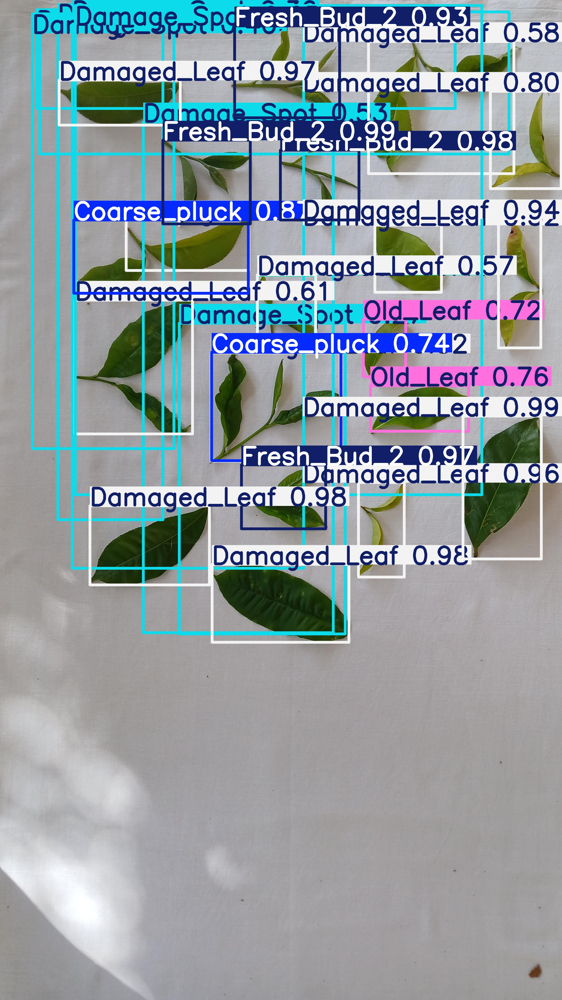


20251224_145258_jpg.rf.b501021b5de1d28c4613e9431e4395ed.jpg


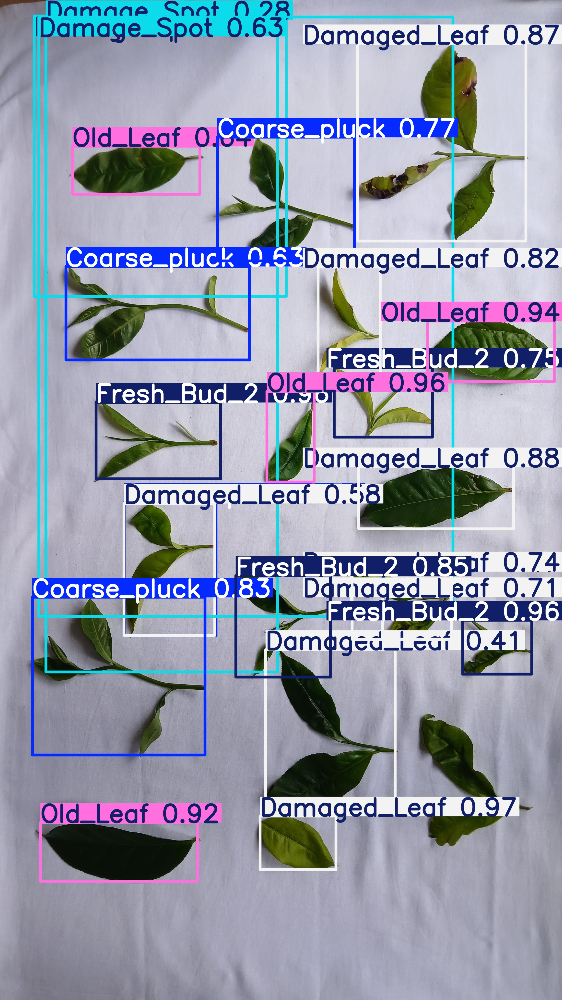


20251224_145827_jpg.rf.16cb072c46ecfd0cb4adbc7ee5290f76.jpg


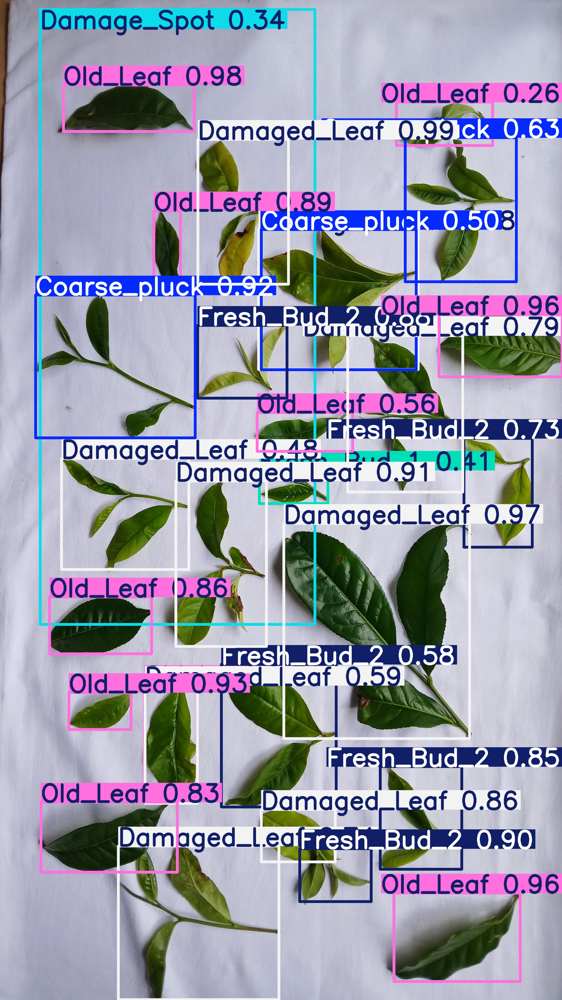


20251224_145841_jpg.rf.135fa0900dac1401028380c7fb8d0f04.jpg


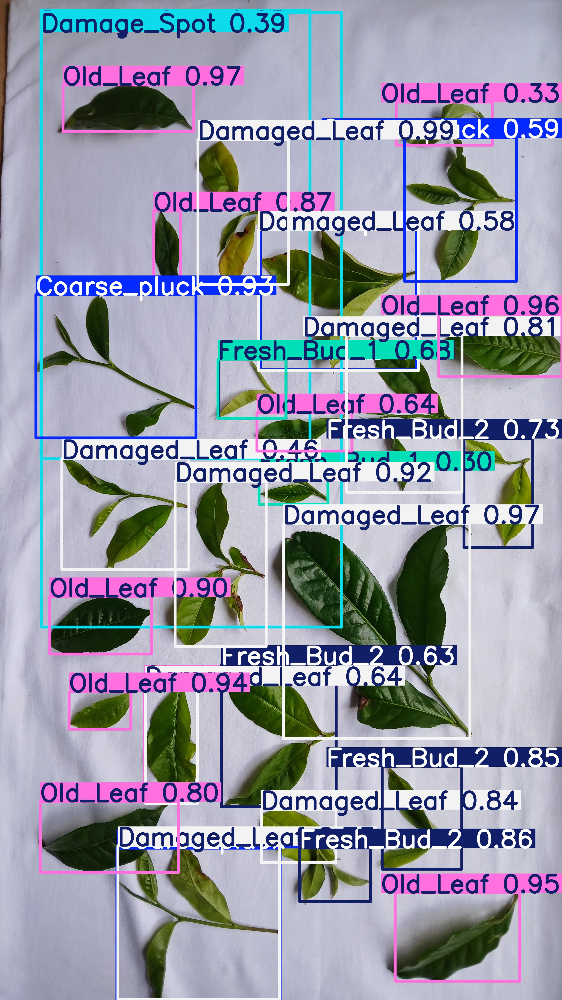


20251224_151234_jpg.rf.a97bbc55222d5d8ea9ff5501e4e8c6e8.jpg


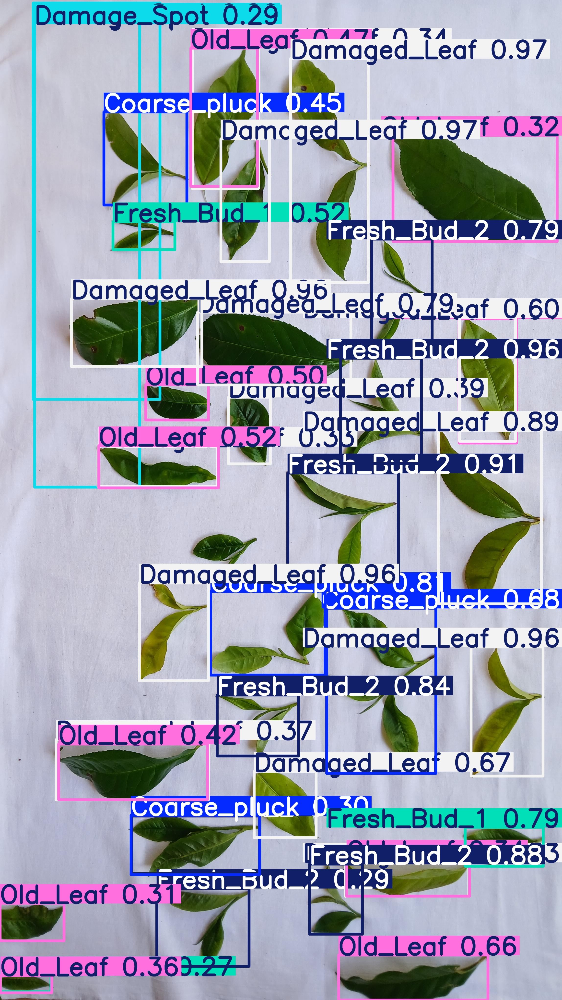

In [10]:
# Display some test predictions
pred_dir = 'runs/detect/test_predictions'
pred_images = glob.glob(f'{pred_dir}/*')

for img_path in pred_images[:5]:  # Show first 5 predictions
    print(f"\n{os.path.basename(img_path)}")
    display(Image(filename=img_path, width=500))

## 10. Single Image Inference

In [11]:
# Inference on a single image
sample_image = test_images[0] if test_images else None

if sample_image:
    result = best_model.predict(sample_image, conf=0.25)[0]
    
    print(f"Image: {sample_image}")
    print(f"Detections found: {len(result.boxes)}")
    
    # Print detection details
    for box in result.boxes:
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])
        cls_name = result.names[cls_id]
        print(f"  - {cls_name}: {conf:.2f}")


image 1/1 C:\Nipuna\TEST\test\images\20251224_143546_jpg.rf.47d8ca68e8414a37be1be366d41181c2.jpg: 640x384 (no detections), 68.5ms
Speed: 3.5ms preprocess, 68.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
Image: test/images\20251224_143546_jpg.rf.47d8ca68e8414a37be1be366d41181c2.jpg
Detections found: 0


## 11. Export Model

In [12]:
# Export to ONNX format (optional)
# best_model.export(format='onnx')

print(f"\nBest model saved at: {results_dir}/weights/best.pt")
print(f"Last model saved at: {results_dir}/weights/last.pt")


Best model saved at: runs/detect/tea_leaf_detection/weights/best.pt
Last model saved at: runs/detect/tea_leaf_detection/weights/last.pt
